In [1]:
import torch
import torchvision
from torchvision import models
from torchvision import transforms as T
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
#load
model = models.detection.retinanet_resnet50_fpn(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=RetinaNet_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=RetinaNet_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_coco-eeacb38b.pth
100%|██████████| 130M/130M [00:01<00:00, 126MB/s]


In [3]:
tf_ = T.ToTensor() # transformer

In [5]:
img = Image.open("/content/image (3).png")
transformed = tf_(img)
batched = transformed.unsqueeze(0) # model input
int_img = torch.tensor(transformed * 255, dtype=torch.uint8)

<ipython-input-5-17b4c7236793>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  int_img = torch.tensor(transformed * 255, dtype=torch.uint8) # its for our bounding box utility


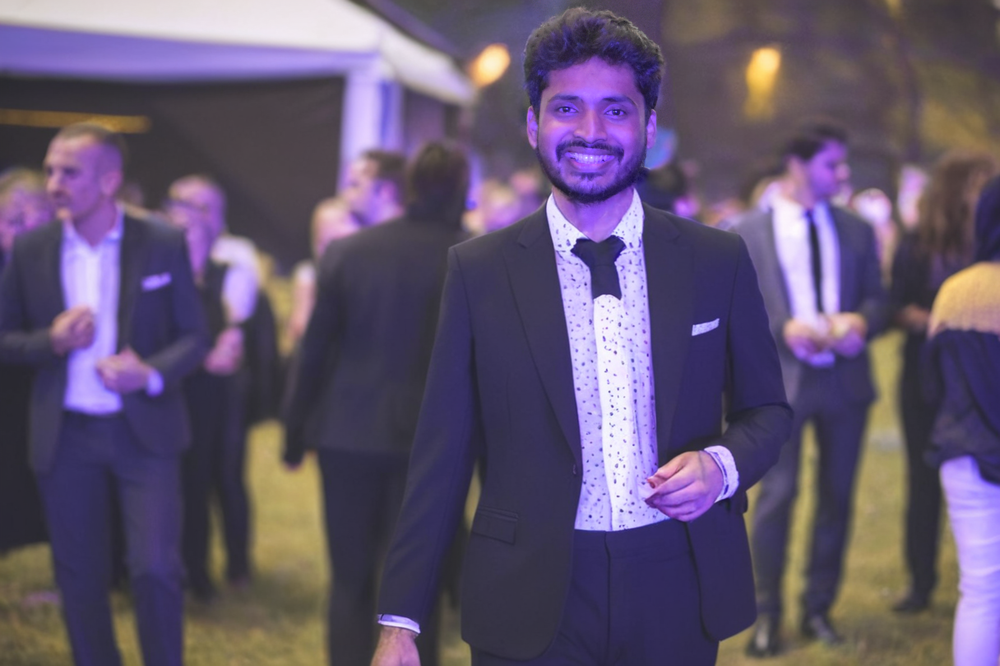

In [6]:
img

In [7]:
model = model.eval()
with torch.no_grad():
  out = model(batched)

In [8]:
from torchvision.utils import draw_bounding_boxes

In [9]:
score_threshold = .7

In [10]:
first_out = out[0]

In [11]:
bounding_boxes_img = draw_bounding_boxes(int_img, first_out['boxes'][first_out['scores'] > score_threshold], width=8)

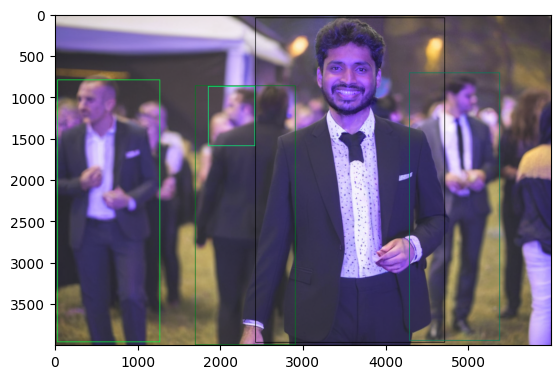

In [12]:

plt.imshow(bounding_boxes_img.permute(1, 2, 0)) # convert image to matplotlib compatible

In [22]:
import cv2
import torch
from torchvision.utils import draw_bounding_boxes

score_threshold = 0.7

model = model.eval()

video = cv2.VideoCapture('/content/Retail.mp4')

if not video.isOpened():
    print("Error: Could not open video.")
else:
    frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = video.get(cv2.CAP_PROP_FPS)

    output_video = cv2.VideoWriter(
        '/content/processed_output.mp4',
        cv2.VideoWriter_fourcc(*'mp4v'),
        fps,
        (frame_width, frame_height)
    )

    while video.isOpened():
        ret, frame = video.read()
        if not ret:
            break


        transformed = tf_(frame)
        batched = transformed.unsqueeze(0)

        with torch.no_grad():

            out = model(batched)
            first_out = out[0]

            boxes = first_out['boxes'][first_out['scores'] > score_threshold]

            frame_tensor = torch.tensor(frame).permute(2, 0, 1)

            if boxes.size(0) > 0:
                frame_with_boxes = draw_bounding_boxes(
                    frame_tensor,
                    boxes,
                    width=8,
                    colors="blue"
                ).permute(1, 2, 0).numpy()
            else:
                frame_with_boxes = frame

        output_video.write(frame_with_boxes)

        # cv2.imshow('Bounding Boxes', frame_with_boxes)

        if cv2.waitKey(25) & 0xFF == ord('q'):
            break


    video.release()
    output_video.release()
    cv2.destroyAllWindows()
